<a href="https://colab.research.google.com/github/BJB0/To-do-list-project-/blob/main/Time_series_DataVisualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Plotting live data in Real-time**

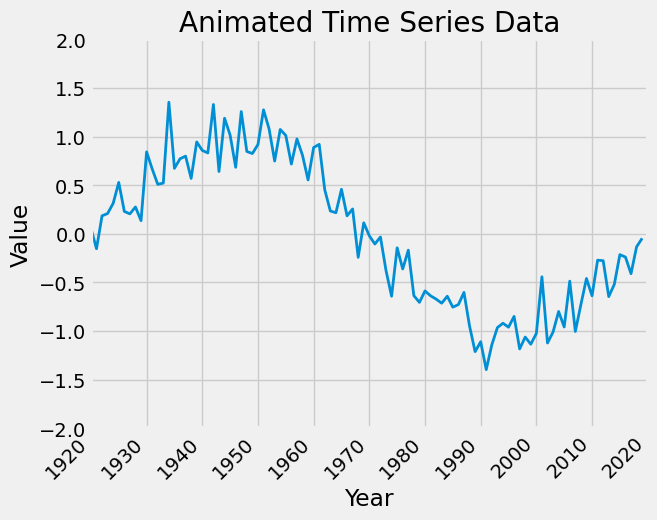

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

# Generate sample data
years = np.arange(1920, 2021)
data = np.sin(np.linspace(0, 2 * np.pi, len(years))) + 0.2 * np.random.randn(len(years))

# Plot setup
fig, ax = plt.subplots()
line, = ax.plot([], [], lw=2)

# Set axis limits and labels
y_min = np.floor(data.min())
y_max = np.ceil(data.max())
ax.set_ylim(y_min, y_max)
ax.set_xlim(1920, 2020)
ax.set_xlabel("Year")
ax.set_ylabel("Value")
ax.set_title("Animated Time Series Data")

# Correct the xticks
plt.xticks(np.arange(1920, 2021, 10), rotation=45, ha="right")

# Initialize the animation
def init():
    line.set_data([], [])
    return line,

# Update function for each frame
def update(frame):
    x = years[:frame]
    y = data[:frame]  # Use the actual data for y-values
    line.set_data(x, y)
    return line,

# Create the animation
animation = FuncAnimation(fig, update, frames=len(years), init_func=init, blit=True)

# Display the animation in Colab
HTML(animation.to_jshtml())


# **Animated Bar chart**

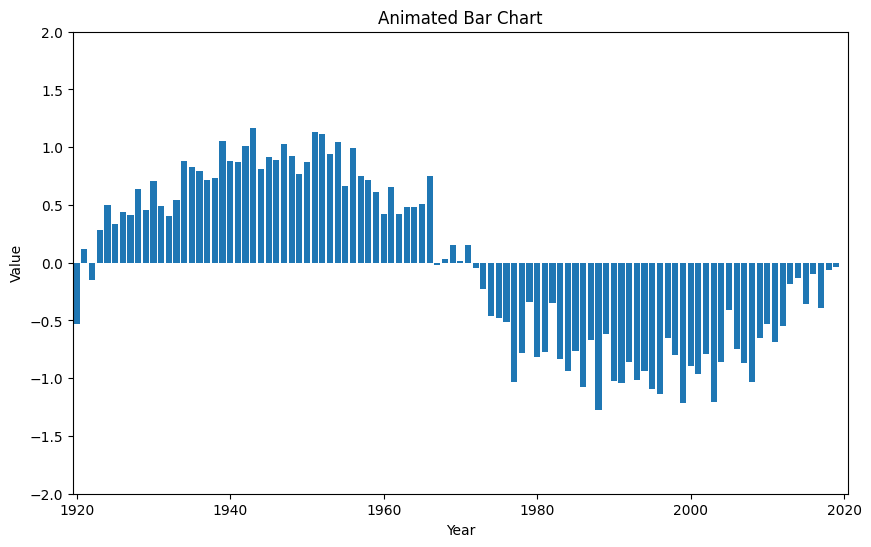

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Generate sample data
years = np.arange(1920, 2021)
data = np.sin(np.linspace(0, 2 * np.pi, len(years))) + 0.2 * np.random.randn(len(years))

# Plot setup
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(years, np.zeros_like(data), width=0.8, align='center')

# Set axis limits and labels
ax.set_xlim(1919.5, 2020.5)
ax.set_ylim(np.floor(data.min()), np.ceil(data.max()))
ax.set_xlabel("Year")
ax.set_ylabel("Value")
ax.set_title("Animated Bar Chart")

# Initialize the animation
def init():
    for bar in bars:
        bar.set_height(0)  # Start all bars with height 0
    return bars

# Update function for each frame
def update(frame):
    for i, bar in enumerate(bars):
        if i < frame:  # Only update up to the current frame
            bar.set_height(data[i])  # Set the height to the corresponding data point
    return bars

# Create the animation
animation = FuncAnimation(fig, update, frames=len(years), init_func=init, blit=True)

# Display the animation in Colab
HTML(animation.to_jshtml())


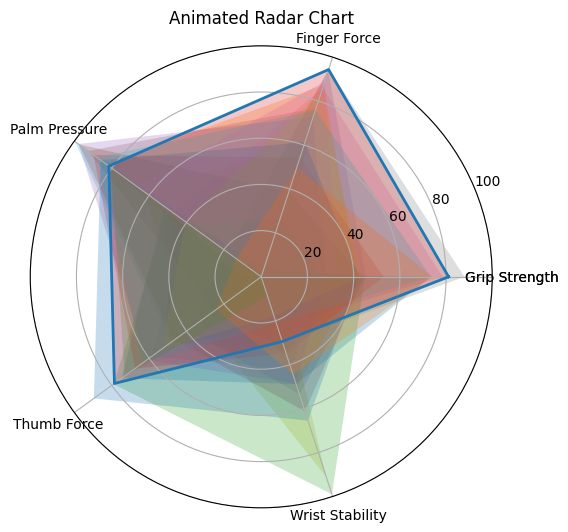

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Metrics for Temporal Force Synergies and Postures
force_metrics = ['Grip Strength', 'Finger Force', 'Palm Pressure', 'Thumb Force', 'Wrist Stability']
angle_metrics = ['Thumb Angle', 'Index Finger Angle', 'Middle Finger Angle', 'Ring Finger Angle', 'Little Finger Angle']

# Choose the type of visualization (Force or Angles)
metrics = force_metrics  # Replace with angle_metrics for angles
num_frames = 20  # Number of frames for the animation

# Generate random data for synergies or angles
data = [np.random.rand(len(metrics)) * 100 for _ in range(num_frames)]  # Random values scaled to 100

# Add a circular wrap for radar chart
metrics = metrics + [metrics[0]]  # Repeat the first metric for closure
data = [np.append(frame, frame[0]) for frame in data]  # Ensure data forms a closed shape

# Compute angles for radar chart
angles = np.linspace(0, 2 * np.pi, len(metrics), endpoint=True)

# Set up the radar chart
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
line, = ax.plot([], [], lw=2)
ax.fill([], [], alpha=0.25)

# Configure chart labels and limits
ax.set_xticks(angles)
ax.set_xticklabels(metrics)
ax.set_ylim(0, 100)  # Scale from 0 to 100 for both synergies and angles
ax.set_title("Animated Radar Chart")

# Initialize animation
def init():
    line.set_data([], [])
    ax.fill([], [], alpha=0.25)
    return line,

# Update function for animation
def update(frame):
    values = data[frame]  # Get data for the current frame
    line.set_data(angles, values)
    ax.fill(angles, values, alpha=0.25)
    return line,

# Create the animation
animation = FuncAnimation(fig, update, frames=num_frames, init_func=init, blit=True)

# Display the animation
HTML(animation.to_jshtml())


In [ ]:
import pandas as pd
dataset = pd.read_csv('/20th_Force_dataset_with mass (1) (1).csv')


### **LINE-PLOT**

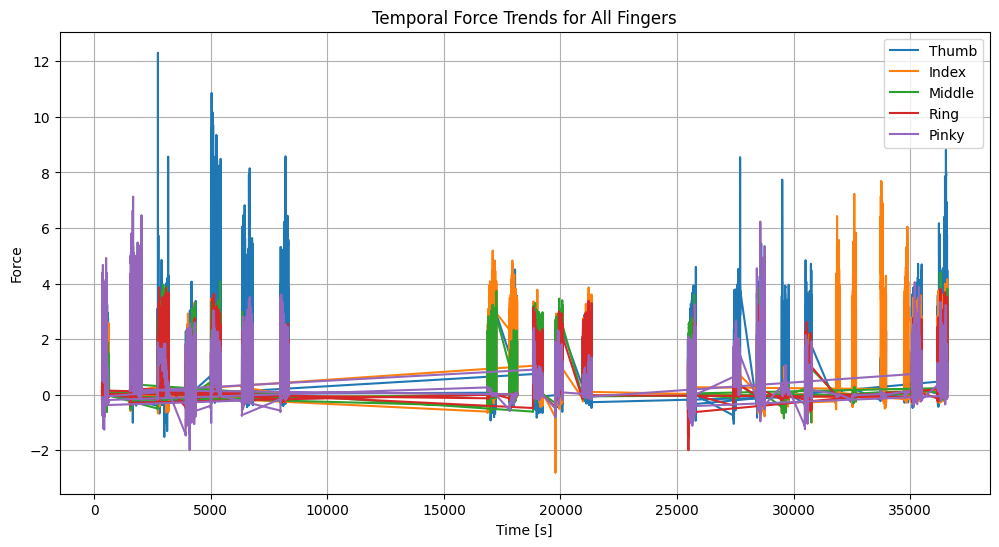

In [ ]:
import matplotlib.pyplot as plt

# Extracting data
time = dataset["Time [s]"]
fingers = ["Thumb", "Index", "Middle", "Ring", "Pinky"]

# Plotting
plt.figure(figsize=(12, 6))
for finger in fingers:
    plt.plot(time, dataset[finger], label=finger)

plt.title("Temporal Force Trends for All Fingers")
plt.xlabel("Time [s]")
plt.ylabel("Force")
plt.legend()
plt.grid(True)
plt.show()


### **HEATMAP**

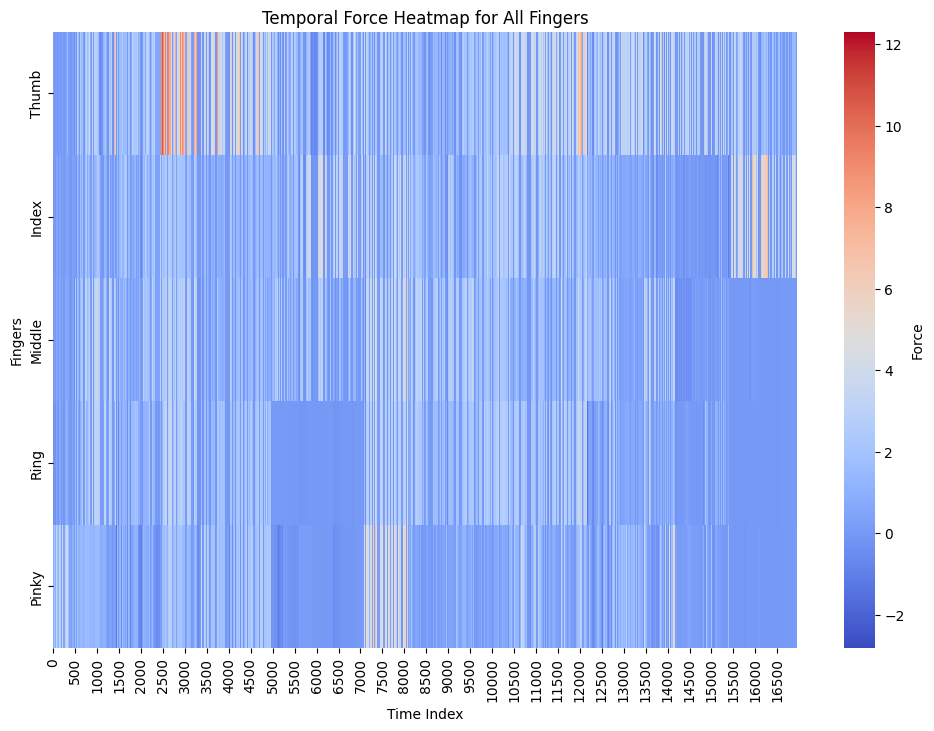

In [ ]:
import seaborn as sns
import numpy as np

# Prepare data for heatmap
heatmap_data = dataset[fingers].T  # Transpose to align fingers as rows

# Plotting
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap="coolwarm", xticklabels=500, yticklabels=fingers, cbar_kws={'label': 'Force'})
plt.title("Temporal Force Heatmap for All Fingers")
plt.xlabel("Time Index")
plt.ylabel("Fingers")
plt.show()


### **3D Plot: Force vs. Time vs. Fingers**

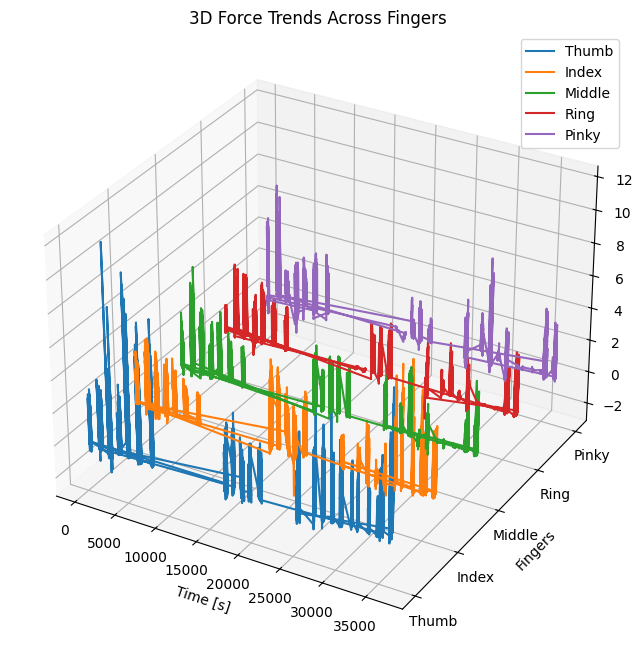

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot data for each finger
for i, finger in enumerate(fingers):
    ax.plot(time, [i]*len(time), dataset[finger], label=finger)

ax.set_title("3D Force Trends Across Fingers")
ax.set_xlabel("Time [s]")
ax.set_ylabel("Fingers")
ax.set_yticks(range(len(fingers)))
ax.set_yticklabels(fingers)
ax.set_zlabel("Force")
ax.legend()
plt.show()


### **Animated Plot: Dynamic Temporal Visualization**

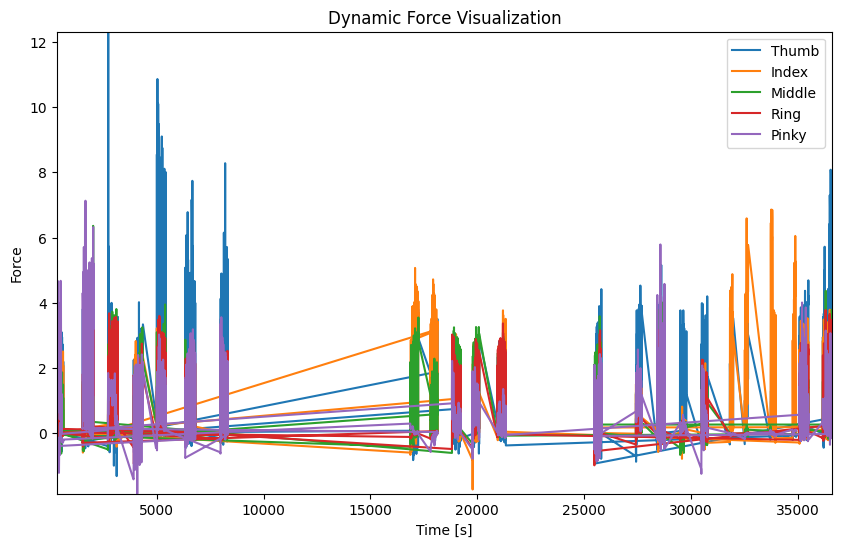

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib as mpl

# Increase embedding limit
mpl.rcParams['animation.embed_limit'] = 100  # Set to 100 MB

# Extract and optionally downsample data
dataset_sampled = dataset.iloc[::10, :]
time = dataset_sampled["Time [s]"]
fingers = ["Thumb", "Index", "Middle", "Ring", "Pinky"]

# Initialize the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))
lines = {finger: ax.plot([], [], label=finger)[0] for finger in fingers}

# Set up plot limits and labels
ax.set_xlim(time.min(), time.max())
ax.set_ylim(dataset_sampled[fingers].min().min(), dataset_sampled[fingers].max().max())
ax.set_title("Dynamic Force Visualization")
ax.set_xlabel("Time [s]")
ax.set_ylabel("Force")
ax.legend()

# Initialization function
def init():
    for line in lines.values():
        line.set_data([], [])
    return lines.values()

# Update function
def update(frame):
    for finger, line in lines.items():
        line.set_data(time[:frame], dataset_sampled[finger][:frame])
    return lines.values()

# Create the animation
ani = FuncAnimation(fig, update, frames=len(time), init_func=init, blit=True)

# Option 1: Display animation in notebook
HTML(ani.to_jshtml())

# Option 2: Save animation
# ani.save("force_animation.mp4", fps=30, dpi=100)  # Uncomment to save as MP4
plt.show()
